# Project 2: Advanced Lane Finding ##

## Import necessary packages ## 

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
from glob import glob

## Camera calibration ##

**The first step is to callibrate the camera, and correct for distortion.**

**To start, we need to find the chessboard corners on the images. These corners will be displayed on a separate window.**

In [8]:
# importing the images
images = [cv2.imread(image) for image in glob("camera_cal/calibration*.jpg")]

# The size od=f all images
height, width = images[0].shape[:2]

pattern = (9, 6)

# The coordinates of the corners in the real world, measured in squares (length of a square side)
# (x, y, z) for each corner, with z=0 for all of them, for simplicity.
real_corners = np.zeros((pattern[0]*pattern[1], 3), np.float32)
real_corners[:, :2] = np.mgrid[0:pattern[0], 0:pattern[1]].T.reshape(-1, 2)

# Stores the real corner coordinates for each chessboard. 
# All will have the same set of coordinates [(0, 0, 0), (1, 0, 0), (x, y, z)], 
# where (x, y, z) are measured in squares 
object_points = []

# This will contain the coordinates of the corners of each chessboard image.
# Since all images are different, the coordinates will be different.
# The coordinates are measured in pixels.
image_points = []

show_images = False
interactive = False

for i, img in enumerate(images):
    # image = cv2.imread(img)
    image = np.copy(img)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, pattern)

    if ret:
        image_points.append(corners)
        object_points.append(real_corners)

        if show_images:
            cv2.drawChessboardCorners(image, pattern, corners, ret)
            cv2.imshow("Chessboard corners", image)
            key = None

            if interactive:
                # if the program is interactive, wait forever until a key is pressed
                key = cv2.waitKey(0)
                # Next image wil will be shown when the user presses the spacebar
                if key == ord(' '):
                    continue
            else:
                key = cv2.waitKey(500)

            # if the user quits, no more images will be show, but corners will still be appended.
            if key == ord('q'):
                show_images = False

cv2.destroyAllWindows()

**These corners can be used to find the camera matrix and the distortion coefficients.**

In [9]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, (width, height), None, None)

**The matrix `mtx` and the distortion coefficients `dist` can be used to undistort the images. A test is done below.**

In [19]:
for i, image in enumerate(images):
    undistorted = cv2.undistort(image, mtx, dist)
    f, (left, right) = plt.subplots(1, 2, figsize=(16, 9))
    left.set_title("Original image "+str(i+1))
    left.imshow(image)
    right.set_title("Undistorted image "+str(i+1))
    right.imshow(undistorted)
    

**It looks like the undistortion and camera calibration were successful. This means that the camera matrix `mtx` and the distortion coefficients `dist` obtained earlier are suitable to undistort the images from the road.**

## Color thresholding
In order to do this, the images first need to be undistorted

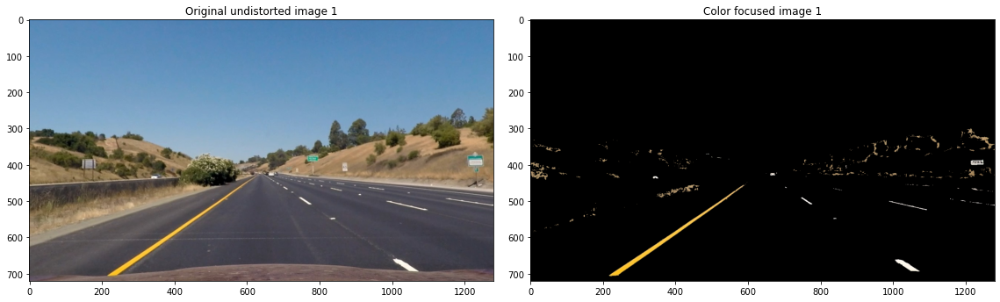

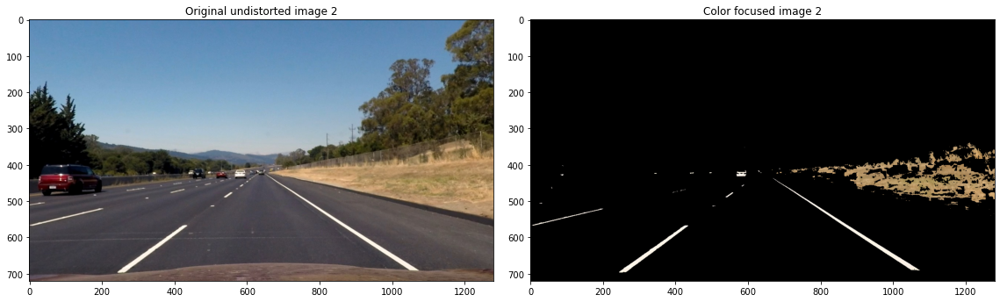

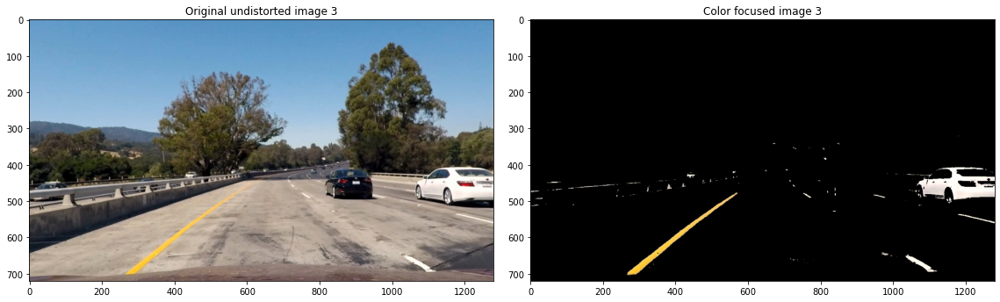

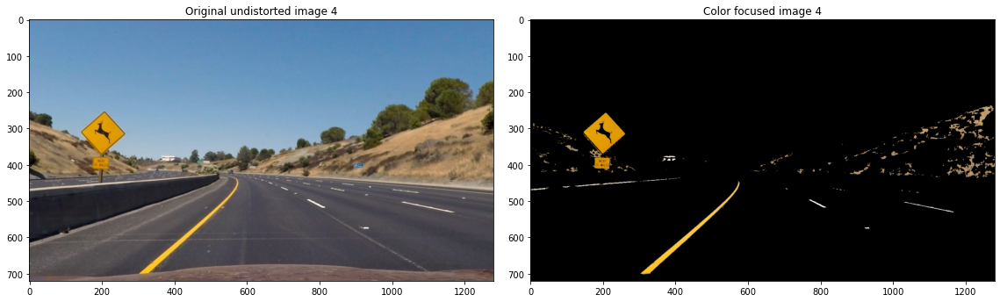

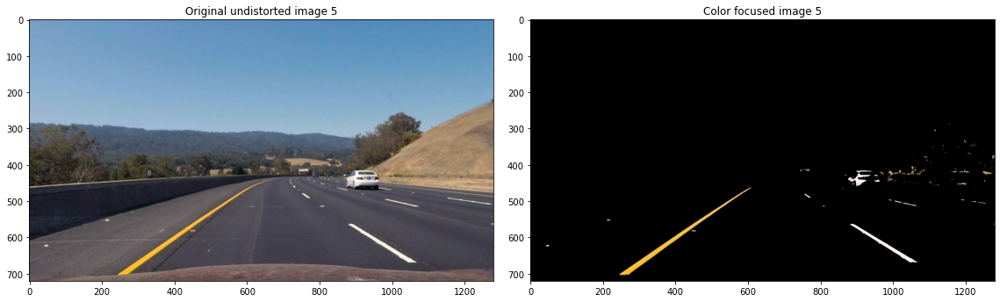

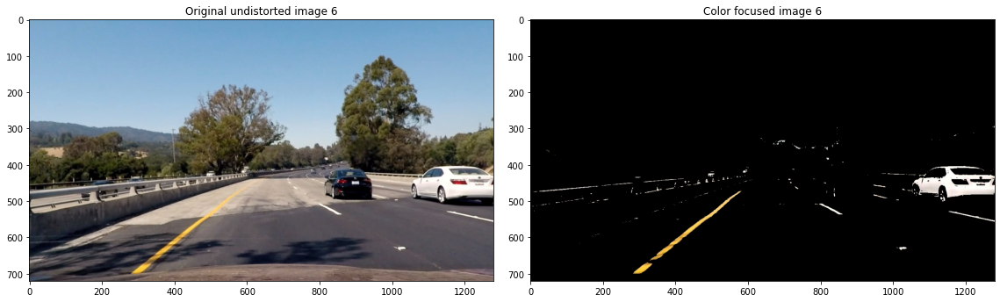

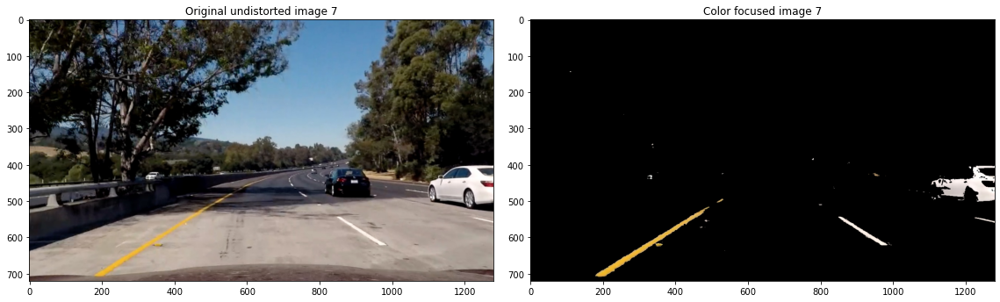

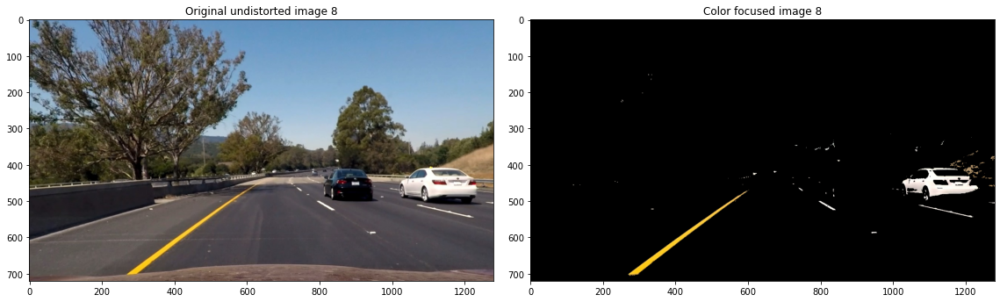

In [29]:
# First, a function to focus on a particular color (yellow to white, in this case)
def color_focus(image):
    """
    Keep mostly just yellow and white in the given image
    """
    # the range of shades of yellow to detect, in HSV
    yellow_min_hsv = (17, 95, 160)
    yellow_max_hsv = (25, 255, 255)
    # the range of shades of white to detect, in HSV
    white_min_hsv = (0, 0, 200)
    white_max_hsv = (80, 30, 255)
    
    # convert the image from rgb to hsv, for easy manipulation
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # a mask to filter only the tones of yellow that are between those specified
    yellow_mask = cv2.inRange(hsv_image, yellow_min_hsv, yellow_max_hsv)
    # a mask to filter only the tones of white that are between those specified
    white_mask = cv2.inRange(hsv_image, white_min_hsv, white_max_hsv)
    # combining the masks so only whites and yellows are kept in the image
    full_mask = yellow_mask | white_mask
    
    return full_mask

# selecting all images in the test_images folder
test_images = [mpimg.imread(image) for image in glob("test_images/*")]

# undistort the test images
undistorted_images = [cv2.undistort(image, mtx, dist) for image in test_images]
for i, undistorted in enumerate(undistorted_images):
    mpimg.imsave(f"output_images/Undistorted_images/Undistorted{i+1}.jpg", undistorted)

color_focused = list(map(color_focus, undistorted_images))

for i, image in enumerate(undistorted_images):
    f, (left, right) = plt.subplots(1, 2, figsize=(16, 9))
    f.tight_layout()
    left.set_title("Original undistorted image " + str(i+1))
    left.imshow(image)

    right.set_title("Color focused image "+ str(i+1))
    # plotting the part of the original image where only yellow and white are shown
    right.imshow(cv2.bitwise_and(image, image, mask=color_focused[i]))



## Magnitude and Gradient thresholding
Color thresholding alone seems to identify the lanes pretty well. Let's try to combine it with magnitude and gradient thresholding.

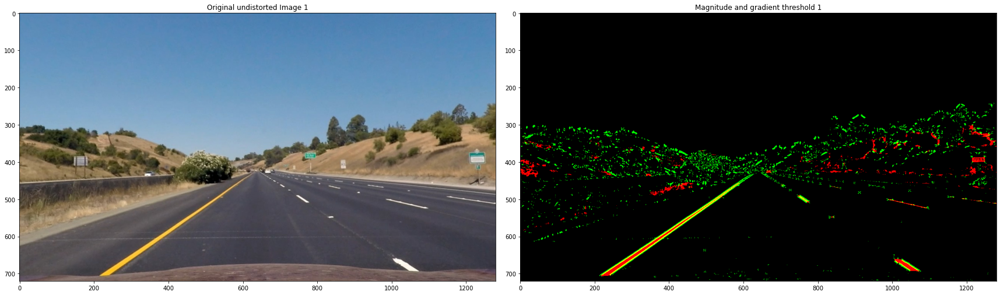

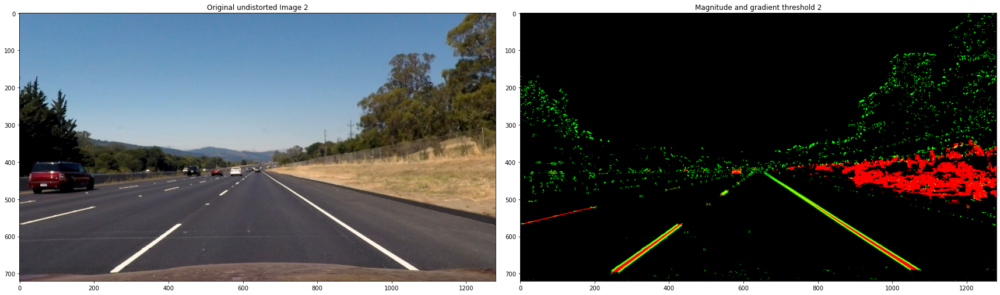

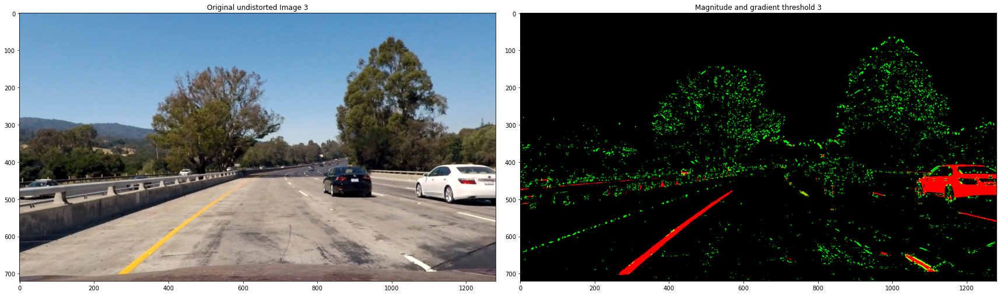

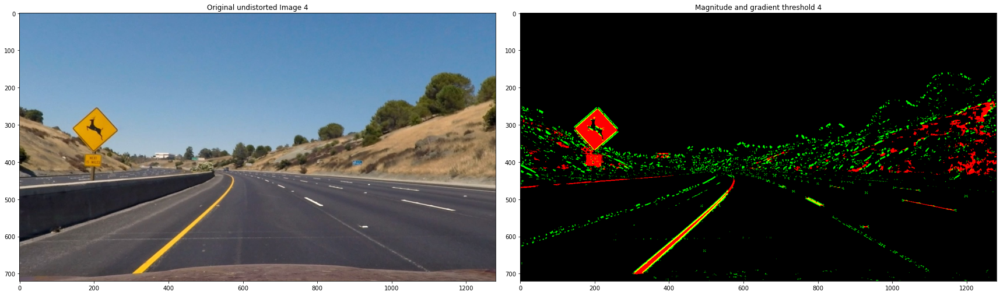

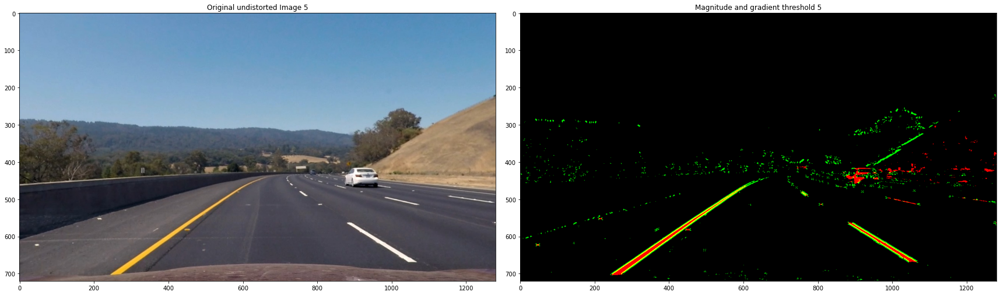

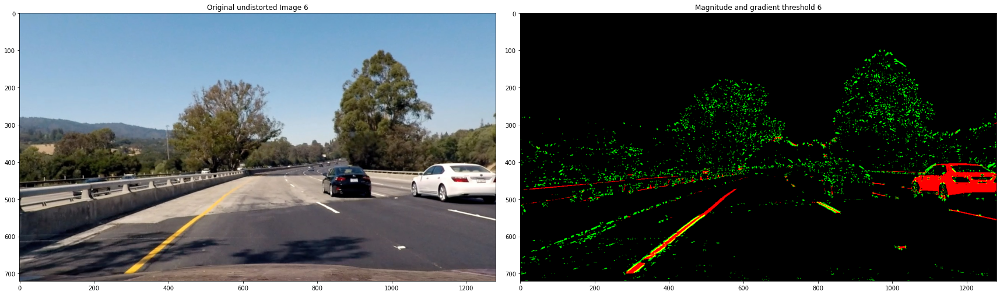

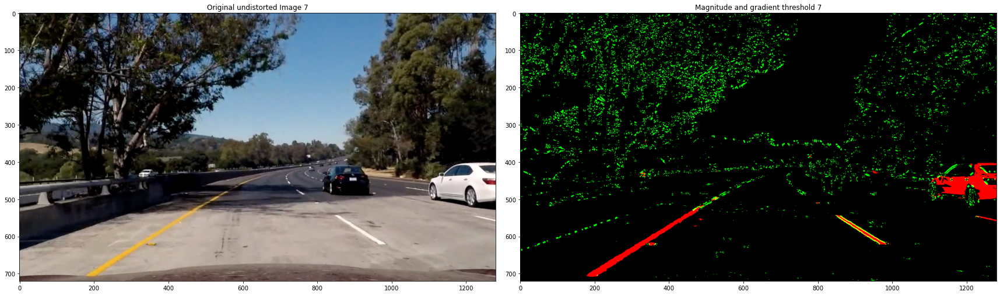

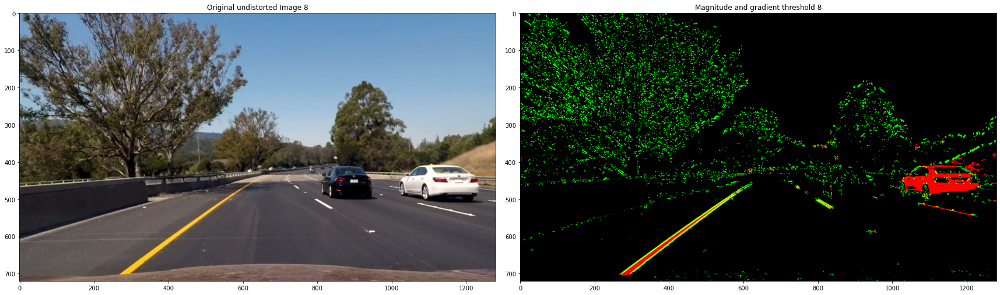

In [28]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=5, mag_thresh=(30, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x and y
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel = np.uint8(sobel * 255 / np.max(sobel))
    # 5) Create a mask where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    mask = (sobel >= mag_thresh[0]) & (sobel <= mag_thresh[1])

    return mask
    
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=5, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x and y
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.abs(sobel_x)
    abs_sobel_y = np.abs(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # This is the direction in which the color intensity changes the most around each pixel
    directions = np.arctan2(abs_sobel_x, abs_sobel_y)
    # 5) Create a mask where direction thresholds are met
    mask = (min(thresh) <= directions) & (directions <= max(thresh))
    # 6) Return this mask as your image
    return mask

# a mask for pixels whose gradient magnitude and direction are suitable
mag_dir_masks = []  

for i, image in enumerate(undistorted_images):
    mag_binary = mag_thresh(image)
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(np.radians(20), np.radians(50)))
    
    mag_dir_mask = mag_binary & dir_binary
    mag_dir_masks.append(mag_dir_mask)
# color_focused[i]
    color_mag_dir = np.dstack((color_focused[i], np.uint8(mag_dir_mask)*255, np.zeros_like(mag_dir_mask, dtype=np.uint8)))

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original undistorted Image '+str(i+1))
    ax2.imshow(color_mag_dir, cmap='gray')
    ax2.set_title('Magnitude and gradient threshold ' + str(i+1))

In the images above, red are the parts detected by the color thresholding, green are the parts detected by gradient and maginitude thresholding, and yellow is where both detect the same feature. It can be seen that when it comes to detecting lanes, color detection is more significant, as the lanes are either red or yellow. The gradinet and maginitude simply add more irrelevant features and sometimes sexted the lane lines.
With this, the conclusion is that gradient and maginitude thresholding does not significantly contribute to better line detection, provided that good color thresholding is in place.